In [91]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import numpy as np
import os

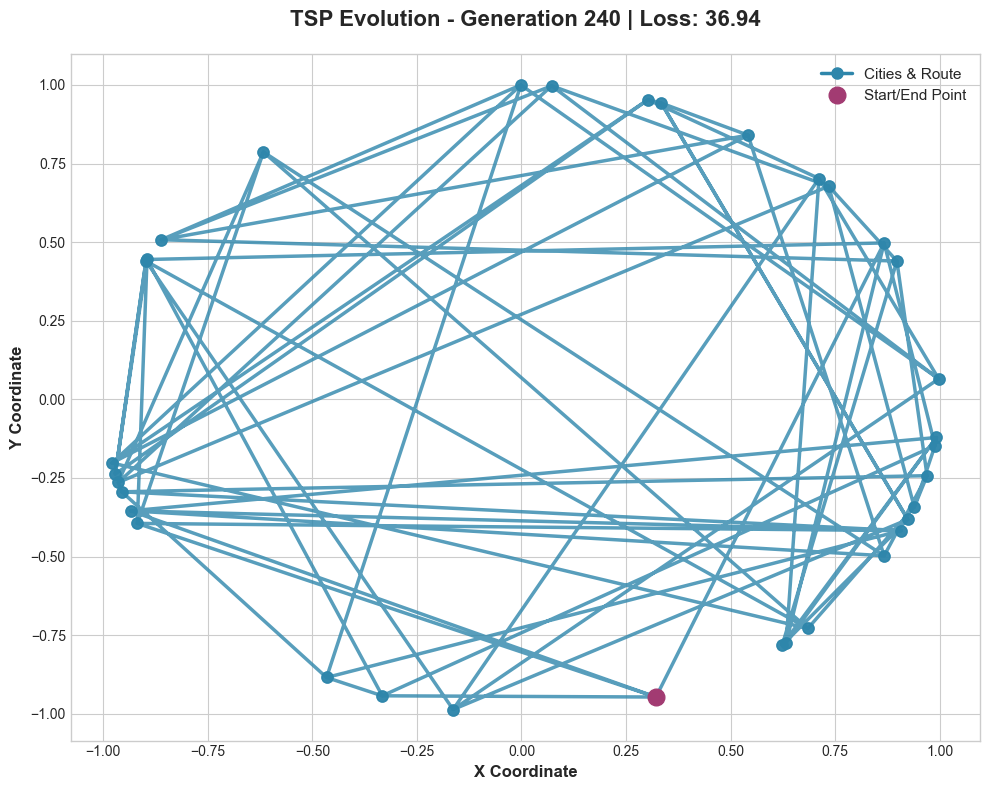

In [92]:
def read_output_file(filename):
    """Legge un file output e restituisce le coordinate dei punti e il loss."""
    points = []
    loss = None
    
    try:
        with open(filename, 'r') as f:
            lines = f.readlines()
            
        for line in lines:
            line = line.strip()
            if line.startswith("Loss:"):
                loss = float(line.split(":")[1].strip())
            elif line and not line.startswith("Partial results"):
                coords = line.split()
                if len(coords) == 2:
                    x, y = float(coords[0]), float(coords[1])
                    points.append((x, y))
    except:
        return [], None
    
    return points, loss

def create_tsp_animation():
    """Crea un'animazione TSP semplice e professionale."""
    
    generations = list(range(0, 250, 10))
    all_data = []
    
    for gen in generations:
        filename = f"/Users/marta/Documents/LSN/09/09.1/OUTPUT/output{gen}.txt"
        if os.path.exists(filename):
            points, loss = read_output_file(filename)
            if points and loss is not None:
                all_data.append((gen, points, loss))
    
    if not all_data:
        print("Nessun dato trovato!")
        return
    
    # Setup della figura
    plt.style.use('seaborn-v0_8-whitegrid')
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Calcola i limiti globali per mantenere la scala fissa
    all_points = [point for _, points, _ in all_data for point in points]
    all_x = [p[0] for p in all_points]
    all_y = [p[1] for p in all_points]
    margin = (max(all_x) - min(all_x)) * 0.05
    
    ax.set_xlim(min(all_x) - margin, max(all_x) + margin)
    ax.set_ylim(min(all_y) - margin, max(all_y) + margin)
    
    # Elementi del plot che verranno aggiornati
    line, = ax.plot([], [], 'o-', color='#2E86AB', linewidth=2.5, markersize=8, alpha=0.8)
    start_point, = ax.plot([], [], 'o', color='#A23B72', markersize=12, zorder=5)
    
    # Styling
    ax.set_xlabel('X Coordinate', fontsize=12, fontweight='bold')
    ax.set_ylabel('Y Coordinate', fontsize=12, fontweight='bold')
    ax.tick_params(labelsize=10)
    
    # Title che verrà aggiornato
    title = ax.set_title('', fontsize=16, fontweight='bold', pad=20)
    
    def animate(frame):
        """Funzione di animazione."""
        gen, points, loss = all_data[frame]
        
        if not points:
            return line, start_point, title
        
        # Prepara le coordinate (chiude il ciclo)
        x_coords = [p[0] for p in points] + [points[0][0]]
        y_coords = [p[1] for p in points] + [points[0][1]]
        
        # Aggiorna la linea e i punti
        line.set_data(x_coords, y_coords)
        
        # Aggiorna il punto di partenza
        start_point.set_data([points[0][0]], [points[0][1]])
        
        # Aggiorna il titolo
        title.set_text(f'TSP Evolution - Generation {gen} | Loss: {loss:.2f}')
        
        return line, start_point, title
    
    # Crea l'animazione
    anim = animation.FuncAnimation(
        fig, animate, frames=len(all_data), 
        interval=600, blit=True, repeat=True
    )
    
    # Aggiungi una legenda
    legend_elements = [
        plt.Line2D([0], [0], marker='o', color='#2E86AB', linewidth=2.5, 
                  markersize=8, label='Cities & Route'),
        plt.Line2D([0], [0], marker='o', color='#A23B72', linewidth=0, 
                  markersize=12, label='Start/End Point')
    ]
    ax.legend(handles=legend_elements, loc='upper right', fontsize=11)
    
    plt.tight_layout()
    return anim

# Esegui l'animazione
anim = create_tsp_animation()
# Forza l'animazione a partire in Jupyter
from IPython.display import HTML
HTML(anim.to_jshtml())


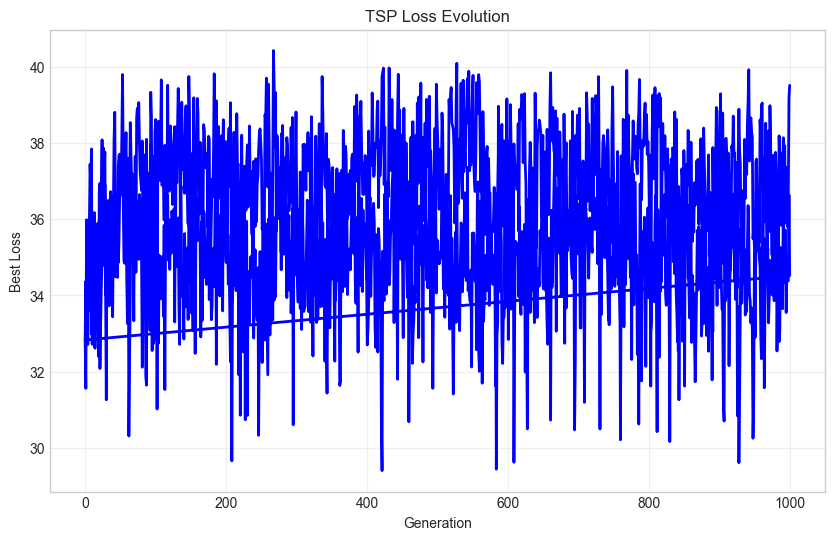

Initial loss: 32.830
Final loss: 39.510
Best loss: 29.405
Improvement: -20.3%


In [93]:
# Leggi i dati dal file loss.txt
data = np.loadtxt('/Users/marta/Documents/LSN/09/09.1/OUTPUT/loss.txt')

# Estrai generazioni e loss
generations = data[:, 0]
losses = data[:, 1]

# Crea il grafico
plt.figure(figsize=(10, 6))
plt.plot(generations, losses, 'b-', linewidth=2)
plt.xlabel('Generation')
plt.ylabel('Best Loss')
plt.title('TSP Loss Evolution')
plt.grid(True, alpha=0.3)
plt.show()

# Stampa statistiche
print(f"Initial loss: {losses[0]:.3f}")
print(f"Final loss: {losses[-1]:.3f}")
print(f"Best loss: {min(losses):.3f}")
print(f"Improvement: {((losses[0] - losses[-1]) / losses[0] * 100):.1f}%")